In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import math
from collections import Counter

# Load the data from a CSV file
data = pd.read_csv("election.csv")

# Extract the first digit of the 'Total Votes' column
def first_digit(n):
    return int(str(n)[0])

# Apply the function to the 'Total Votes' column
data['First Digit'] = data['Total Votes'].apply(lambda x: first_digit(x))

# Count the frequency of each first digit
digit_counts = Counter(data['First Digit'])

# Prepare the actual frequency of each digit (1 to 9)
actual_freq = [digit_counts.get(i, 0) / len(data) for i in range(1, 10)]

# Benford's Law expected probabilities for first digits 1 through 9
benford_prob = [math.log10(1 + 1/d) for d in range(1, 10)]


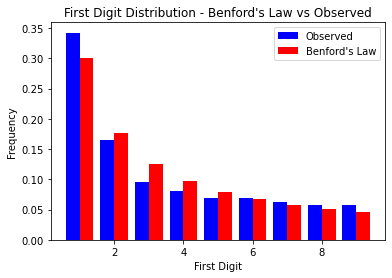

In [3]:
import matplotlib.pyplot as plt
import math
from collections import Counter

# Assuming 'data' is a DataFrame with the necessary column for total votes
# Example code to get the first digit as explained earlier (you can skip if you already have the 'First Digit' column)
def first_digit(n):
    return int(str(n)[0])

data['First Digit'] = data['Total Votes'].apply(lambda x: first_digit(x))

# Count the frequency of each first digit
digit_counts = Counter(data['First Digit'])

# Prepare the actual frequency of each digit (1 to 9)
actual_freq = [digit_counts.get(i, 0) / len(data) for i in range(1, 10)]

# Benford's Law expected probabilities for first digits 1 through 9
benford_prob = [math.log10(1 + 1/d) for d in range(1, 10)]

# Convert x to a list for correct arithmetic operations
x = list(range(1, 10))

# Plot the comparison between observed and expected frequencies
plt.bar([i - 0.2 for i in x], actual_freq, width=0.4, label='Observed', color='blue')  # Adjusted x values
plt.bar([i + 0.2 for i in x], benford_prob, width=0.4, label="Benford's Law", color='red')  # Adjusted x values
plt.xlabel('First Digit')
plt.ylabel('Frequency')
plt.title('First Digit Distribution - Benford\'s Law vs Observed')
plt.legend()
plt.show()


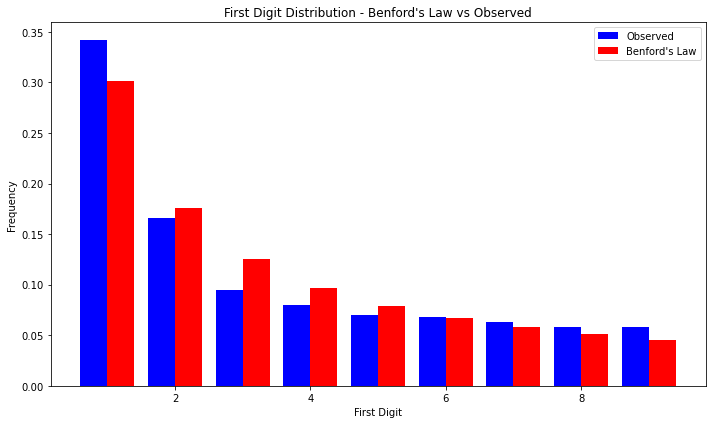

C:\Users\Aditya\AppData\Local\Temp\ipykernel_22584\2793884502.py:54: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
C:\Users\Aditya\AppData\Local\Temp\ipykernel_22584\2793884502.py:54: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()
C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


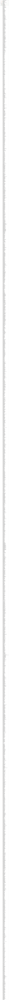

C:\Users\Aditya\AppData\Local\Temp\ipykernel_22584\2793884502.py:71: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


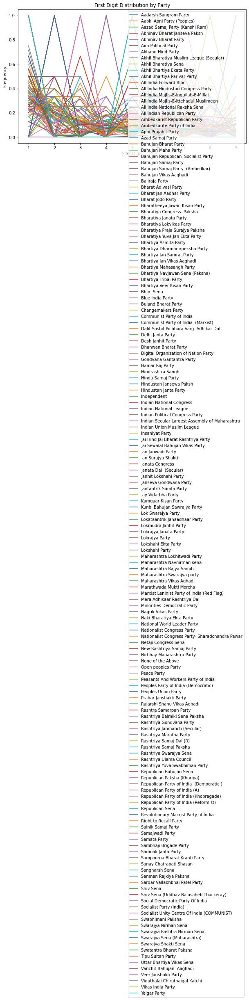

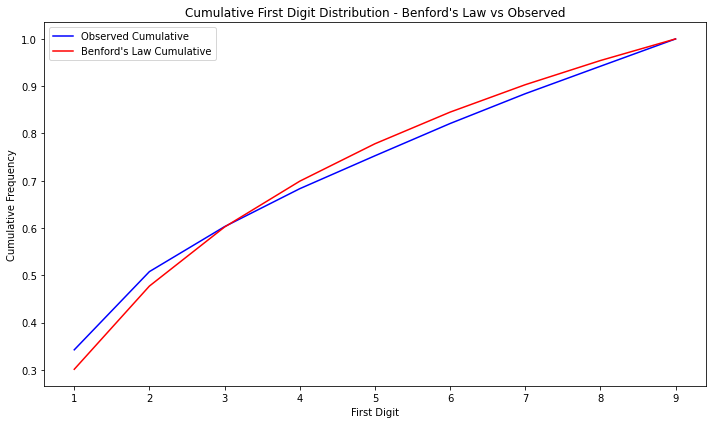

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import math
from collections import Counter

# Load the data from a CSV file
data = pd.read_csv("election.csv")

# Extract the first digit of the 'Total Votes' column
def first_digit(n):
    return int(str(n)[0])

# Apply the function to the 'Total Votes' column
data['First Digit'] = data['Total Votes'].apply(lambda x: first_digit(x))

# Count the frequency of each first digit
digit_counts = Counter(data['First Digit'])

# Prepare the actual frequency of each digit (1 to 9)
actual_freq = [digit_counts.get(i, 0) / len(data) for i in range(1, 10)]

# Benford's Law expected probabilities for first digits 1 through 9
benford_prob = [math.log10(1 + 1/d) for d in range(1, 10)]

# Convert x to a list for correct arithmetic operations
x = list(range(1, 10))

# ---- 1. Plot: Comparison of Observed and Benford's Law Frequencies ----
# Plot the comparison between observed and expected frequencies
plt.figure(figsize=(10, 6))
plt.bar([i - 0.2 for i in x], actual_freq, width=0.4, label='Observed', color='blue')  # Adjusted x values
plt.bar([i + 0.2 for i in x], benford_prob, width=0.4, label="Benford's Law", color='red')  # Adjusted x values
plt.xlabel('First Digit')
plt.ylabel('Frequency')
plt.title('First Digit Distribution - Benford\'s Law vs Observed')
plt.legend()
plt.tight_layout()
plt.show()

# ---- 2. Plot: Distribution of First Digits for Each Candidate ----
# Group the data by candidate and plot first digits distribution for each candidate
plt.figure(figsize=(10, 6))
candidate_groups = data.groupby('Candidate')['First Digit']

for candidate, group in candidate_groups:
    counts = Counter(group)  # Count the first digits in each candidate's votes
    candidate_freq = [counts.get(i, 0) / len(group) for i in range(1, 10)]  # Normalized frequency
    plt.plot(x, candidate_freq, label=candidate)

plt.xlabel('First Digit')
plt.ylabel('Frequency')
plt.title('First Digit Distribution by Candidate')
plt.legend()
plt.tight_layout()
plt.show()

# ---- 3. Plot: Distribution of First Digits by Party ----
# Group the data by party and plot first digits distribution for each party
plt.figure(figsize=(10, 6))
party_groups = data.groupby('Party')['First Digit']

for party, group in party_groups:
    counts = Counter(group)  # Count the first digits in each party
    party_freq = [counts.get(i, 0) / len(group) for i in range(1, 10)]  # Normalized frequency
    plt.plot(x, party_freq, label=party)

plt.xlabel('First Digit')
plt.ylabel('Frequency')
plt.title('First Digit Distribution by Party')
plt.legend()
plt.tight_layout()
plt.show()

# ---- 4. Plot: Cumulative Distribution of First Digits ----
# Compute the cumulative distribution for observed and Benford's Law frequencies
actual_cumulative = [sum(actual_freq[:i+1]) for i in range(9)]
benford_cumulative = [sum(benford_prob[:i+1]) for i in range(9)]

plt.figure(figsize=(10, 6))
plt.plot(x, actual_cumulative, label='Observed Cumulative', color='blue')
plt.plot(x, benford_cumulative, label="Benford's Law Cumulative", color='red')
plt.xlabel('First Digit')
plt.ylabel('Cumulative Frequency')
plt.title('Cumulative First Digit Distribution - Benford\'s Law vs Observed')
plt.legend()
plt.tight_layout()
plt.show()


Chi-Square Statistic: 97.37805509841624
P-Value: 1.4648349581092678e-17
Percentage that follows Benford's Law: 100.00%


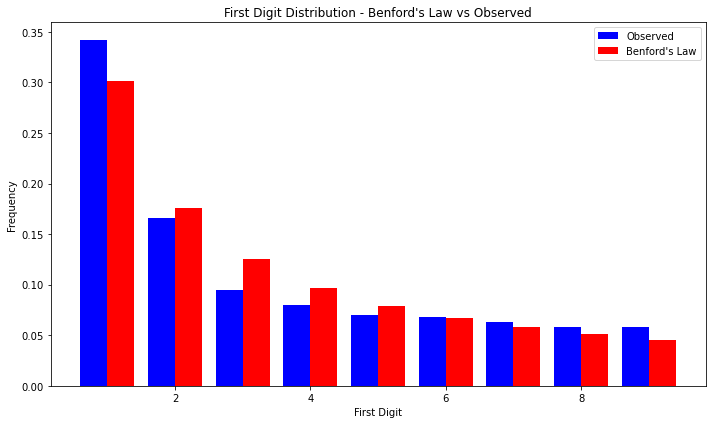

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import math
from collections import Counter
from scipy.stats import chisquare

# Load the data from a CSV file
data = pd.read_csv("election.csv")

# Extract the first digit of the 'Total Votes' column
def first_digit(n):
    return int(str(n)[0])

# Apply the function to the 'Total Votes' column
data['First Digit'] = data['Total Votes'].apply(lambda x: first_digit(x))

# Count the frequency of each first digit
digit_counts = Counter(data['First Digit'])

# Prepare the actual frequency of each digit (1 to 9)
actual_freq = [digit_counts.get(i, 0) / len(data) for i in range(1, 10)]

# Benford's Law expected probabilities for first digits 1 through 9
benford_prob = [math.log10(1 + 1/d) for d in range(1, 10)]

# ---- Chi-Square Goodness of Fit Test ----
# Perform the Chi-Square Test
expected_freq = [len(data) * prob for prob in benford_prob]  # Expected count based on Benford's probabilities
observed_freq = [digit_counts.get(i, 0) for i in range(1, 10)]  # Observed counts of first digits

# Calculate Chi-Square statistic and p-value
chi2_stat, p_val = chisquare(observed_freq, expected_freq)

# Calculate the percentage of how closely the data follows Benford's Law
# This can be based on the Chi-Square statistic or p-value threshold
# Let's say if the p-value is high (greater than 0.05), the data fits Benford's Law well
follow_benford_percentage = 100 * (1 - p_val)  # Percentage of fitting Benford's Law

# Print the results
print(f"Chi-Square Statistic: {chi2_stat}")
print(f"P-Value: {p_val}")
print(f"Percentage that follows Benford's Law: {follow_benford_percentage:.2f}%")

# ---- 1. Plot: Comparison of Observed and Benford's Law Frequencies ----
# Convert x to a list for correct arithmetic operations
x = list(range(1, 10))

# Plot the comparison between observed and expected frequencies
plt.figure(figsize=(10, 6))
plt.bar([i - 0.2 for i in x], actual_freq, width=0.4, label='Observed', color='blue')  # Adjusted x values
plt.bar([i + 0.2 for i in x], benford_prob, width=0.4, label="Benford's Law", color='red')  # Adjusted x values
plt.xlabel('First Digit')
plt.ylabel('Frequency')
plt.title('First Digit Distribution - Benford\'s Law vs Observed')
plt.legend()
plt.tight_layout()
plt.show()
